<div>
<a href="http://www.music-processing.de/"><img style="float:left;" src="../data/FMP_Teaser_Cover.png" width=40% alt="FMP"></a>
<a href="https://www.audiolabs-erlangen.de"><img src="../data/Logo_AudioLabs_Long.png" width=59% style="float: right;" alt="AudioLabs"></a>
</div>

<div>
<a href="../C8/C8.html"><img src="../data/C8_nav.png" width="100"  style="float:right;" alt="C8"></a>
<h1>Harmonic&ndash;Residual&ndash;Percussive Separation (HRPS)</h1> 
</div>

<br/>

<p>
In this notebook, we extend the HP separation approach from <a href="http://www.music-processing.de/">[Müller, FMP, Springer 2015]</a> by considering an additional residual component. Furthermore, we introduce a cascaded procedure of the resulting approach. These two extension were proposed in the following two articles:
  
<ul>
<li><span style="color:black">
Jonathan Driedger, Meinard Müller, Sascha Disch: <strong><a href="https://www.audiolabs-erlangen.de/fau/professor/mueller/publications/2014_DriedgerMuellerDisch_ExtensionsHPSeparation_ISMIR.pdf">Extending Harmonic&ndash;Percussive Separation of Audio Signals.</a></strong> Proceedings of the International Conference on Music Information Retrieval (ISMIR), Taipei, Taiwan, 2014, pp. 611&ndash;616. 
<br>    
<a type="button" class="btn btn-default btn-xs" target="_blank" href="../data/bibtex/FMP_bibtex_DriedgerMD14_SeparationHP_ISMIR.txt"> Bibtex </a>
</span></li>
<li><span style="color:black">
Patricio López-Serrano, Christian Dittmar, Meinard Müller: <strong>Mid-Level Audio Features Based on Cascaded Harmonic&ndash;Residual&ndash;Percussive Separation.</strong> Proceedings of the Audio Engineering Society Conference on Semantic Audio (AES), Erlangen, Germany, 2017, pp. 32&ndash;44. 
<br>    
<a type="button" class="btn btn-default btn-xs" target="_blank" href="../data/bibtex/FMP_bibtex_LopezSerranoDM17_CHRPMidLevelFeatures_AES.txt"> Bibtex </a>
</span></li>
</ul>    
</p> 

## Motivation

Recall that the [underlying assumption of HPS](../C8/C8S1_HPS.html) is that harmonic sounds correspond to horizontal structures in a spectrogram, while percussive sounds to vertical structures. However, there are many sounds that neither correspond to horizontal nor to vertical structures. For example, noise-like sounds such as applause or distorted guitar lead to many Fourier coefficients distributed over the entire spectrogram without any clear structure. When applying the [HPS procedure](../C8/C8S1_HPS.html), such noise-like components may be more or less randomly assigned partly to the harmonic and partly to the percussive component. Continuing our example with the violin (harmonic sound) and castanets (percussive sound), we further consider applause (noise-like sound), which is neither of percussive nor of harmonic nature. 

<table style="border:none;text-align:left;">
   <tr>
      <th style="border:none;text-align:left;">Violin</th>
      <th style="border:none;text-align:left;">Applause</th>
      <th style="border:none;text-align:left;">Castanets</th>
   </tr>
    
   <tr>
      <td style="border:none;text-align:left;"><audio style="width: 200px"; src="../data/C8/FMP_C8_F02_Long_Violin.mp3" type="audio/mpeg" controls="controls"></audio></td>
      <td style="border:none;text-align:left;"><audio style="width: 200px"; src="../data/C8/FMP_C8_F02_Long_Applause.mp3" type="audio/mpeg" controls="controls"></audio></td>
      <td style="border:none;text-align:left;">
         <audio style="width: 200px"; src="../data/C8/FMP_C8_F02_Long_Castanets.mp3" type="audio/mpeg" controls="controls"></audio>
      </td>
   </tr>
</table>

Following Driedger et al. (see also Exercise 8.5 of <a href="http://www.music-processing.de/">[Müller, FMP, Springer 2015]</a>), we introduce an extension to HPS by considering a third **residual component** which captures the sounds that lie **between** a clearly harmonic and a clearly percussive component. The resulting procedure is also referred to as **harmonic&ndash;residual&ndash;percussive separation** (HRPS). The following figure illustrates the conceptual difference between HPS and HRPS.

<img src="../data/C8/FMP_C8_E05_HRP.png" width="600px" align="middle" alt="FMP_C8_E05_HRP">

## HRPS Procedure

Using the same notation as in the [FMP notebook on HPS](../C8/C8S1_HPS.html), we now give the technical description of the HRPS procedure. Let $x:\mathbb{Z}\to\mathbb{R}$ be the input signal. The objective is to decompose $x$ into a harmonic component signal $x^\mathrm{h}$, a residual component signal $x^\mathrm{r}$, and a percussive component signal $x^\mathrm{p}$ such that

\begin{equation}
   x = x^\mathrm{h} +  x^\mathrm{r} + x^\mathrm{p}. 
\end{equation}

The overall pipeline for the HRPS procedure, which closely follows the one for HPS, is illustrated by the following figure.

<!--<img src="../data/C8/FMP_C8_E05.png" width="500px" align="middle" alt="FMP_C8_E05">-->
<img src="../data/C8/FMP_C8_E05_HRP-color.png" width="600px" align="middle" alt="FMP_C8_E05_HRP-color">

First the signal $x$ is transformed into a magnitude spectrogram $\mathcal{Y}$. As described in the <a href="../C8/C8S1_HPS.html">FMP notebook on HPS</a>, we apply median filtering once **horizontally** and once **vertically** to obtain $\tilde{\mathcal{Y}}^\mathrm{h}$ and $\tilde{\mathcal{Y}}^\mathrm{p}$, respectively. For the median filtering, let $L^\mathrm{h}$ and $L^\mathrm{p}$ be the odd length parameters. To define the residual component, we consider an additional parameter $\beta\in\mathbb{R}$ with $\beta \geq 1$ called the **separation factor**. Generalizing the definition of the **binary masks** used in HPS, we define the binary masks $\mathcal{M}^\mathrm{h}$, $\mathcal{M}^\mathrm{r}$, and $\mathcal{M}^\mathrm{p}$
for the clearly harmonic, the clearly percussive, and the residual components by setting

\begin{eqnarray*}
\mathcal{M}^\mathrm{h}(n,k) &:=& 
\begin{cases}
   1 & \text{if } \tilde{\mathcal{Y}}^\mathrm{h}(n,k) \geq \beta\cdot \tilde{\mathcal{Y}}^\mathrm{p}(n,k), \\
   0 & \text{otherwise,}
  \end{cases} \\
\mathcal{M}^\mathrm{p}(n,k) &:=& 
\begin{cases}
   1 & \text{if } \tilde{\mathcal{Y}}^\mathrm{p}(n,k) > \beta\cdot \tilde{\mathcal{Y}}^\mathrm{h}(n,k), \\
   0 & \text{otherwise,}
  \end{cases}\\
\mathcal{M}^\mathrm{r}(n,k) &:=& 1 - \big( \mathcal{M}^\mathrm{h}(n,k) + \mathcal{M}^\mathrm{p}(n,k) \big).
\end{eqnarray*}

Using these masks, one defines

\begin{eqnarray*}
\mathcal{X}^\mathrm{h}(n,k) &:=& \mathcal{M}^\mathrm{h}(n,k) \cdot \mathcal{X}(n,k), \\
\mathcal{X}^\mathrm{p}(n,k) &:=& \mathcal{M}^\mathrm{p}(n,k) \cdot \mathcal{X}(n,k), \\
\mathcal{X}^\mathrm{r}(n,k) &:=& \mathcal{M}^\mathrm{r}(n,k) \cdot \mathcal{X}(n,k)
\end{eqnarray*} 

for $n,k\in\mathbf{Z}$. Finally, one can derive time-domain signal $x^\mathrm{h}$, $x^\mathrm{p}$, and $x^\mathrm{r}$ by applying an inverse STFT. The following function `HRPS` implements this procedure.

In [1]:
import os, sys
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt
import IPython.display as ipd
import librosa.display
import soundfile as sf
import pandas as pd
from collections import OrderedDict

sys.path.append('..')
import libfmp.b
import libfmp.c8
from libfmp.c8 import convert_l_sec_to_frames, convert_l_hertz_to_bins, make_integer_odd


def hrps(x, Fs, N, H, L_h, L_p, beta=2.0, L_unit='physical', detail=False):
    """Harmonic-residual-percussive separation (HRPS) algorithm

    Notebook: C8/C8S1_HRPS.ipynb

    Args:
        x (np.ndarray): Input signal
        Fs (scalar): Sampling rate of x
        N (int): Frame length
        H (int): Hopsize
        L_h (float): Horizontal median filter length given in seconds or frames
        L_p (float): Percussive median filter length given in Hertz or bins
        beta (float): Separation factor (Default value = 2.0)
        L_unit (str): Adjusts unit, either 'pyhsical' or 'indices' (Default value = 'physical')
        detail (bool): Returns detailed information (Default value = False)

    Returns:
        x_h (np.ndarray): Harmonic signal
        x_p (np.ndarray): Percussive signal
        x_r (np.ndarray): Residual signal
        details (dict): Dictionary containing detailed information; returned if "detail=True"
    """
    assert L_unit in ['physical', 'indices']
    # stft
    X = librosa.stft(x, n_fft=N, hop_length=H, win_length=N, window='hann', center=True, pad_mode='constant')
    # power spectrogram
    Y = np.abs(X) ** 2
    # median filtering
    if L_unit == 'physical':
        L_h = convert_l_sec_to_frames(L_h_sec=L_h, Fs=Fs, N=N, H=H)
        L_p = convert_l_hertz_to_bins(L_p_Hz=L_p, Fs=Fs, N=N, H=H)
    L_h = make_integer_odd(L_h)
    L_p = make_integer_odd(L_p)
    Y_h = signal.medfilt(Y, [1, L_h])
    Y_p = signal.medfilt(Y, [L_p, 1])

    # masking
    M_h = np.int8(Y_h >= beta * Y_p)
    M_p = np.int8(Y_p > beta * Y_h)
    M_r = 1 - (M_h + M_p)
    X_h = X * M_h
    X_p = X * M_p
    X_r = X * M_r

    # istft
    x_h = librosa.istft(X_h, hop_length=H, win_length=N, window='hann', center=True, length=x.size)
    x_p = librosa.istft(X_p, hop_length=H, win_length=N, window='hann', center=True, length=x.size)
    x_r = librosa.istft(X_r, hop_length=H, win_length=N, window='hann', center=True, length=x.size)

    if detail:
        return x_h, x_p, x_r, dict(Y_h=Y_h, Y_p=Y_p, M_h=M_h, M_r=M_r, M_p=M_p, X_h=X_h, X_r=X_r, X_p=X_p)
    else:
        return x_h, x_p, x_r

## Example: Violin, Applause, Castanets

We now try out the HRPS procedure by using a superposition of the violin, applause, and castanet recordings from above. The mixture signal sounds like this:

<audio src="../data/C8/FMP_C8_F02_Long_CastanetsViolinApplause.mp3" type="audio/mpeg" controls="controls"></audio>

The next figure shows the binary masks $\mathcal{M}^\mathrm{h}$, $\mathcal{M}^\mathrm{r}$, and $\mathcal{M}^\mathrm{p}$. It is very instructive to listen to the reconstructed signals $x^\mathrm{h}$, $x^\mathrm{r}$, and $x^\mathrm{p}$. The harmonic signal $x^\mathrm{h}$ mostly corresponds to the violin, while the residual signal $x^\mathrm{r}$ captures most of the applause. While the percussive signal $x^\mathrm{p}$ contains the castanets, the signal is quite distorted and still contains many applause components. Another reason of the signal distortions is also due to **phase artifacts** that are introduced by the [signal reconstruction](../C8/C8S1_SignalReconstruction.html) step. These artifacts become audible particularly for the percussive component. 

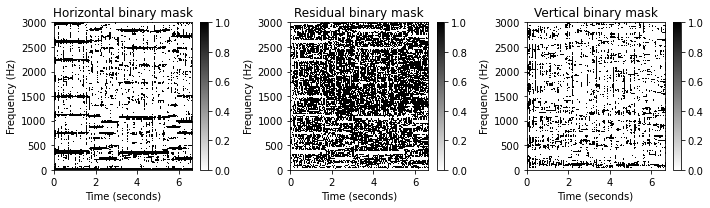

In [2]:
Fs = 22050
fn_wav = os.path.join('..', 'data', 'C8', 'FMP_C8_F02_Long_CastanetsViolinApplause.wav')
x, Fs = librosa.load(fn_wav, sr=Fs)
N = 1024
H = 512
L_h_sec = 0.2
L_p_Hz = 500
beta = 2
x_h, x_p, x_r, D = hrps(x, Fs=Fs, N=N, H=H, 
                        L_h=L_h_sec, L_p=L_p_Hz, beta=beta, detail=True)

ylim = [0, 3000]
plt.figure(figsize=(10,3))
ax = plt.subplot(1,3,1)
libfmp.b.plot_matrix(D['M_h'], Fs=Fs/H, Fs_F=N/Fs, ax=[ax], clim=[0,1],
                     title='Horizontal binary mask')
ax.set_ylim(ylim)

ax = plt.subplot(1,3,2)
libfmp.b.plot_matrix(D['M_r'], Fs=Fs/H, Fs_F=N/Fs, ax=[ax], clim=[0,1],
                     title='Residual binary mask')
ax.set_ylim(ylim)

ax = plt.subplot(1,3,3)
libfmp.b.plot_matrix(D['M_p'], Fs=Fs/H, Fs_F=N/Fs, ax=[ax], clim=[0,1],
                     title='Vertical binary mask')
ax.set_ylim(ylim)

plt.tight_layout()
plt.show()

html_x_h = libfmp.c8.generate_audio_tag_html_list([x_h], Fs=Fs, width='220')
html_x_r = libfmp.c8.generate_audio_tag_html_list([x_r], Fs=Fs, width='220')
html_x_p = libfmp.c8.generate_audio_tag_html_list([x_p], Fs=Fs, width='220')

pd.options.display.float_format = '{:,.1f}'.format    
pd.set_option('display.max_colwidth', None)    
df = pd.DataFrame(OrderedDict([     
    ('$x_h$', html_x_h),                                   
    ('$x_r$', html_x_r),
    ('$x_p$', html_x_p)]))
ipd.display(ipd.HTML(df.to_html(escape=False, header=False, index=False)))

## Effect of Separation Factor

The separation factor $\beta$ can be used to adjust the decomposition. The case $\beta=1$ reduces to the original HP decomposition. By increasing $\beta$, less time&ndash;frequency bins are assigned for the reconstruction of the components $x^\mathrm{h}$ and $x^\mathrm{p}$, whereas more time&ndash;frequency bins are used for the reconstruction of the residual component $x^\mathrm{r}$. Intuitively, the larger the parameter $\beta$, the clearer becomes the harmonic and percussive nature of the components $x^\mathrm{h}$ and $x^\mathrm{p}$. For very large $\beta$, the residual signal $x^\mathrm{r}$ tends to contain the entire signal $x$. This role $\beta$ is illustrated by the following experiment.

<img src="../data/C8/FMP_C8_E05_HRP_beta.png" width="700px" align="middle" alt="FMP_C8_E05_HRP_beta">

<div class="alert alert-block alert-warning">
Warning: For audio playback, we use the class <tt>IPython.display.Audio</tt>, which normalizes the audio (dividing by the maximum over all sample values) before playback. Therefore, in the following experiments, separated signals may sound louder than they actually are (see also the notes on <a href="../B/B_PythonAudio.html">normalized audio playback</a>).
</div> 

In [3]:
param_list = [
    [1024, 256, 0.2, 500, 1.1],
    [1024, 256, 0.2, 500, 2],
    [1024, 256, 0.2, 500, 4],   
    [1024, 256, 0.2, 500, 32],      
]

fn_wav = os.path.join('..', 'data', 'C8', 'FMP_C8_F02_Long_CastanetsViolinApplause.wav')
print('=============================================================')
print('Experiment for ',fn_wav)
libfmp.c8.experiment_hrps_parameter(fn_wav, param_list)

#fn_wav = os.path.join('..', 'data', 'C8', 'FMP_C8_Audio_Bearlin_Roads_Excerpt-85-99_SiSEC_mix.wav')
fn_wav = os.path.join('..', 'data', 'C8', 'FMP_C8_Audio_Bornemark_StopMessingWithMe-Excerpt_SoundCloud_mix.wav')
print('=============================================================')
print('Experiment for ',fn_wav, param_list)
libfmp.c8.experiment_hrps_parameter(fn_wav, param_list) 

Experiment for  ../data/C8/FMP_C8_F02_Long_CastanetsViolinApplause.wav
N=1024, H= 256, L_h_sec=0.20, L_p_Hz=500.0, beta=1.1
N=1024, H= 256, L_h_sec=0.20, L_p_Hz=500.0, beta=2.0
N=1024, H= 256, L_h_sec=0.20, L_p_Hz=500.0, beta=4.0
N=1024, H= 256, L_h_sec=0.20, L_p_Hz=500.0, beta=32.0


Experiment for  ../data/C8/FMP_C8_Audio_Bornemark_StopMessingWithMe-Excerpt_SoundCloud_mix.wav [[1024, 256, 0.2, 500, 1.1], [1024, 256, 0.2, 500, 2], [1024, 256, 0.2, 500, 4], [1024, 256, 0.2, 500, 32]]
N=1024, H= 256, L_h_sec=0.20, L_p_Hz=500.0, beta=1.1
N=1024, H= 256, L_h_sec=0.20, L_p_Hz=500.0, beta=2.0
N=1024, H= 256, L_h_sec=0.20, L_p_Hz=500.0, beta=4.0
N=1024, H= 256, L_h_sec=0.20, L_p_Hz=500.0, beta=32.0


## Cascaded HRPS

The HRPS procedure can be further extended. For example, López-Serrano et al. introduced a **cascaded harmonic&ndash;residual&ndash;percussive** (CHRPS) procedure. First, using a large separation factor (e.g.,  $\beta=5$), a signal is separated into harmonic (H), residual (R), and percussive (P) components. Then, using a smaller separation factor (e.g.,  $\beta=3$), the residual component of the first stage is further composed. More generally, using $B\in\mathbb{R}$ cascading stages with decreasing separation factors $\beta_1 > \beta_2 > \ldots >\beta_B$, the CHRP procedure produces $(2B+1)$ component signals&mdash;their sum being equal to the input signal $x$ (up to a small error). Once all the required cascading stages are complete, the component signals are sorted on an axis that goes from harmonic, through residual, to percussive. The next figure illustrates this procedure using $B = 3$. In this case, the CHRP procedure produces seven component signals referred to as H, RH, RRH, RRR, RRP, RP, and P. 

<img src="../data/C8/FMP_C8_E05_HRP-cascaded.png" width="400px" align="middle" alt="FMP_C8_E05_CHRP_Ex-Snare">

## CHRP Features

Motivated by tasks such as **musical event density** and [**music structure analysis**](../C4/C4S1_MusicStructureGeneral.html), we now introduce a mid-level feature representation. To this end, we compute the local energy for each of the  $2B+1$  component signals using a sliding window technique. To this end, we use a window of length $N\in\mathbb{N}$ and hop size  $H\in\mathbb{N}$ . Let $M\in\mathbb{N}$ be the number of energy frames. We then stack the local energy values of all component signal into a feature matrix  $V=(v_1,\ldots,v_M)$  such that $v_m\in\mathbb{R}^{2B+1}$, for  $m\in[1:M]$. Furthermore, the columns $v_m$ may be [normalized using, e.g., the $\ell^1$-norm](../C3/C3S1_FeatureNormalization.html). Then each  $v_m\in[0,1]^{2B+1}$ expresses the energy distribution across the components for each frame $m\in[1:M]$.

In the following example, we show the CHRP feature matrix for a signal consisting of five non-overlapping sound samples: castanets, snare roll, applause, staccato strings and legato violin. The castanets have the highest percussive energy and are well confined to the P component. The snare roll is predominantly composed of RP and RRR. Indeed, snare drums have a percussive attack and a decay curve which is both noisy and tonal (according to the drum's tuning frequency). When struck in rapid succession, the noisy decay tails overpower the percussive onsets. Applause is centered around RRR and well-confined to the residual region. The staccato strings are predominantly harmonic, with an additional RH component which corresponds to the noisy attacks that emerge in this playing technique. Violin legato is confined to the H component, since the stable, harmonic signal properties dominate all other components.

<img src="../data/C8/FMP_C8_E05_CHRP_Ex-Ramp.png" width="500px" align="left" alt="FMP_C8_E05_CHRP_Ex-Ramp">

<br clear="all" />

<audio style="width: 450px;" src="../data/C8/FMP_C8_PLS-Fig-5-2_PRH-RampSynthetic.mp3" type="audio/mpeg" controls="controls"></audio>

The next example shows energy migrating from percussive to residual in a snare-playing technique known as **paradiddles**. In the next figure, we show the waveform of paradiddles played on a snare drum; first with increasing speed ($0$-$40$ sec), and then with decreasing speed ($40$-$75$ sec). In the resulting CHRP feature matrix, one can notice how there is very little remaining P-energy after a certain onset frequency or playing speed has been reached (around $25$ sec). This is due to the fact that the noise-like tails reach a relative proximity and overpower the individual percussive onsets, centering the energy around the residual components in the feature matrix.

<img src="../data/C8/FMP_C8_E05_CHRP_Ex-Snare.png" width="600px" align="left" alt="FMP_C8_E05_CHRP_Ex-Snare">

<br clear="all" />

<audio style="width: 450px;" src="../data/C8/FMP_C8_PLS-Fig-5-3_Paradiddle.mp3" type="audio/mpeg" controls="controls"></audio>

For further sound examples and details, we refer to the [demo website for cascaded HRPS](https://www.audiolabs-erlangen.de/resources/MIR/2017-AES-CHRP) .

## Further Notes

One finds further instructive examples and links to the research literature in the [FMP notebook on applications of HPS and HRPS](../C8/C8S1_HPS-Application.html).

<div class="alert" style="background-color:#F5F5F5; border-color:#C8C8C8">
<strong>Acknowledgment:</strong> This notebook was created by <a href="https://www.audiolabs-erlangen.de/fau/professor/mueller">Meinard Müller</a>, <a href="https://www.audiolabs-erlangen.de/fau/assistant/zalkow">Frank Zalkow</a>, and  <a href="https://www.audiolabs-erlangen.de/fau/assistant/lopez"> Patricio López-Serrano</a>.</div> 

<table style="border:none">
<tr style="border:none">
    <td style="min-width:50px; border:none" bgcolor="white"><a href="../C0/C0.html"><img src="../data/C0_nav.png" style="height:50px" alt="C0"></a></td>
    <td style="min-width:50px; border:none" bgcolor="white"><a href="../C1/C1.html"><img src="../data/C1_nav.png" style="height:50px" alt="C1"></a></td>
    <td style="min-width:50px; border:none" bgcolor="white"><a href="../C2/C2.html"><img src="../data/C2_nav.png" style="height:50px" alt="C2"></a></td>
    <td style="min-width:50px; border:none" bgcolor="white"><a href="../C3/C3.html"><img src="../data/C3_nav.png" style="height:50px" alt="C3"></a></td>
    <td style="min-width:50px; border:none" bgcolor="white"><a href="../C4/C4.html"><img src="../data/C4_nav.png" style="height:50px" alt="C4"></a></td>
    <td style="min-width:50px; border:none" bgcolor="white"><a href="../C5/C5.html"><img src="../data/C5_nav.png" style="height:50px" alt="C5"></a></td>
    <td style="min-width:50px; border:none" bgcolor="white"><a href="../C6/C6.html"><img src="../data/C6_nav.png" style="height:50px" alt="C6"></a></td>
    <td style="min-width:50px; border:none" bgcolor="white"><a href="../C7/C7.html"><img src="../data/C7_nav.png" style="height:50px" alt="C7"></a></td>
    <td style="min-width:50px; border:none" bgcolor="white"><a href="../C8/C8.html"><img src="../data/C8_nav.png" style="height:50px" alt="C8"></a></td>
</tr>
</table>